## Tecnologías de IA

**Entregable 1 - 30%**

**Parte A** 

## German Traffic Signs

### Overview

German traffic signs are standardized symbols used to regulate, warn, or guide drivers and pedestrians. They are essential for road safety and traffic management. Signs are divided into categories based on their function.

### Categories

| Category     | Description |
|-------------|-------------|
| Regulatory   | Rules that must be followed (e.g., Stop, Yield, Speed Limits) |
| Warning      | Alert to hazards or changes (e.g., Sharp Curve, Pedestrian Crossing, Roadworks) |
| Informational | Guidance or facilities (e.g., Highway, Parking, Hospital) |
| Priority     | Indicate right of way (e.g., Main Road, End of Priority Road) |
| Prohibitory  | Forbidden actions (e.g., No Entry, No Parking, No Overtaking) |

### German Traffic Sign Recognition Benchmark (GTSRB)

- Dataset widely used for computer vision and machine learning.  
- Contains **images of 43 traffic sign classes**.  
- Images vary in size, lighting, and viewpoint, reflecting real-world conditions.  
- Commonly used for **multiclass classification tasks** in AI projects.  

### List of 43 Classes

## German Traffic Sign Classes (3 Columns)

| ID  | Sign Name                  | ID  | Sign Name                 | ID  | Sign Name                 |
|-----|----------------------------|-----|---------------------------|-----|---------------------------|
| 0   | Speed Limit 20 km/h        | 15  | No Vehicles               | 30  | Cyclists                  |
| 1   | Speed Limit 30 km/h        | 16  | Vehicles > 3.5t Prohibited| 31  | Snow/Ice                  |
| 2   | Speed Limit 50 km/h        | 17  | No Entry                  | 32  | Wild Animals              |
| 3   | Speed Limit 60 km/h        | 18  | General Caution           | 33  | End of All Restrictions   |
| 4   | Speed Limit 70 km/h        | 19  | Dangerous Curve Left      | 34  | Turn Right Ahead          |
| 5   | Speed Limit 80 km/h        | 20  | Dangerous Curve Right     | 35  | Turn Left Ahead           |
| 6   | End of Speed Limit 80 km/h | 21  | Double Curve              | 36  | Ahead Only                |
| 7   | Speed Limit 100 km/h       | 22  | Bumpy Road                | 37  | Go Straight or Right      |
| 8   | Speed Limit 120 km/h       | 23  | Slippery Road             | 38  | Go Straight or Left       |
| 9   | No Overtaking              | 24  | Road Narrows Left         | 39  | Keep Right                |
| 10  | No Overtaking for Trucks   | 25  | Road Narrows Right        | 40  | Keep Left                 |
| 11  | Priority Road              | 26  | Road Works                | 41  | Roundabout                |
| 12  | End of Priority Road       | 27  | Traffic Signals           | 42  | End of No Overtaking      |
| 13  | Give Way                   | 28  | Pedestrian Crossing       |     |                           |
| 14  | Stop                       | 29  | Children                  |     |                           

## References

- [GTSRB Dataset on Kaggle](https://www.kaggle.com/datasets/meowmeowmeowmeowmeow/gtsrb-german-traffic-sign)  
- [German Road Traffic Regulations](https://www.gesetze-im-internet.de/stvo_2013/)

### Loading creating dataset class

In [145]:
import os
import pandas as pd
from PIL import Image
import torch 
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

class GTSRBDataset(Dataset):
    def __init__(self, root_dir, csv_file=None, transform=None, train=True):
        self.train = train
        self.transform = transform
        if train:
            self.samples = []
            for label in range(43):
                dir_path = os.path.join(root_dir, 'Train', str(label))
                for fname in os.listdir(dir_path):
                    self.samples.append((os.path.join(dir_path, fname), label))
        else:
            df = pd.read_csv(csv_file)
            self.samples = [(os.path.join(root_dir, row['Path']), row['ClassId'])
                            for idx, row in df.iterrows()]

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        image = Image.open(path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label

### Creating transforms

In [146]:
train_transform = transforms.Compose([
    transforms.Resize((28, 28)),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.3212, 0.2969, 0.3051],
                         std=[0.1629, 0.1616, 0.1687])
])

test_transform = transforms.Compose([
    transforms.Resize((28, 28)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.3212, 0.2969, 0.3051],
                         std=[0.1629, 0.1616, 0.1687])
])

### Loading dataset

Download and unzip the dataset from:

https://www.kaggle.com/datasets/meowmeowmeowmeowmeow/gtsrb-german-traffic-sign

In [164]:
root_dir = "/Users/carlosandresarroyaveoutlook.com/Documents/GitHub/IA/Entregable1_30/archive"
csv_test = os.path.join(root_dir, "Test.csv")

train_dataset = GTSRBDataset(root_dir=root_dir, transform=train_transform, train=True)
test_dataset = GTSRBDataset(root_dir=root_dir, csv_file=csv_test, transform=test_transform, train=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

print("Tamaño train:", len(train_dataset))
print("Tamaño test:", len(test_dataset))

images, labels = next(iter(train_loader))
print("Batch imágenes:", images.shape)
print("Batch etiquetas:", labels.shape)

Tamaño train: 39209
Tamaño test: 12630
Batch imágenes: torch.Size([64, 3, 28, 28])
Batch etiquetas: torch.Size([64])


### EDA

In [165]:
import warnings

warnings.filterwarnings("ignore")

import torch
from tqdm import tqdm
def compute_mean_std(loader):
    n_images = 0
    mean = 0.0
    std = 0.0

    for images, _ in tqdm(loader):
        batch_samples = images.to(device).size(0)
        images = images.view(batch_samples, images.size(1), -1)

        mean += images.mean(2).sum(0)
        std += images.std(2).sum(0)
        n_images += batch_samples

    mean /= n_images
    std /= n_images
    return mean, std

mean, std = compute_mean_std(train_loader)
print("Mean:", mean)
print("Std:", std)

100%|██████████| 613/613 [00:13<00:00, 46.85it/s]

Mean: tensor([0.0015, 0.0017, 0.0023])
Std: tensor([0.9999, 0.9989, 0.9995])


In [167]:
import matplotlib.pyplot as plt
from collections import Counter

def plot_class_distribution(dataset, title="Class distribution"):
    labels = [label for _, label in tqdm(dataset)]
    counter = Counter(labels)

    classes = sorted(counter.keys())
    counts = [counter[c] for c in classes]

    plt.figure(figsize=(12,6))
    plt.bar(classes, counts, color='skyblue')
    plt.xlabel("Class")
    plt.ylabel("Quantity of images")
    plt.title(title)
    plt.xticks(classes)
    plt.show()

100%|██████████| 39209/39209 [00:11<00:00, 3455.43it/s]


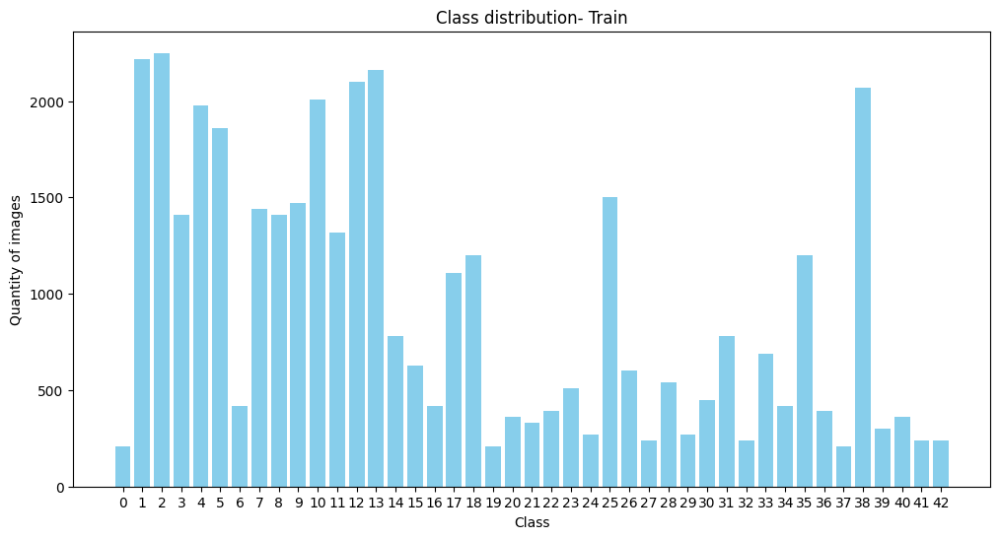

100%|██████████| 12630/12630 [00:01<00:00, 6945.60it/s]


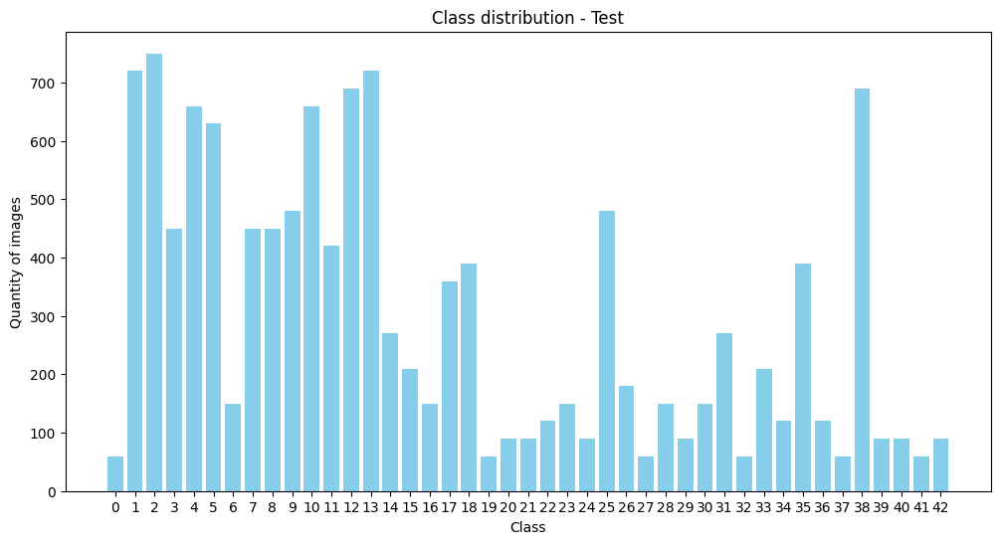

In [168]:
plot_class_distribution(train_dataset, title="Class distribution- Train")

plot_class_distribution(test_dataset, title="Class distribution - Test")

In [169]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import random

MEAN = torch.tensor([0.3212, 0.2969, 0.3051]).view(3,1,1)
STD  = torch.tensor([0.1629, 0.1616, 0.1687]).view(3,1,1)

def denormalize_image(image_tensor):
    image = image_tensor * STD + MEAN
    image = image.permute(1,2,0).numpy()
    return np.clip(image, 0, 1)

def create_class_index(dataset):
    class_to_indices = defaultdict(list)
    for i, (_, label) in enumerate(tqdm(dataset)):
        class_to_indices[label].append(i)
    return class_to_indices

def show_examples_all_classes(dataset, class_to_indices, n=5):
    num_classes = len(class_to_indices)
    for class_id in sorted(class_to_indices.keys()):
        indices = class_to_indices[class_id]
        chosen_indices = random.sample(indices, min(n, len(indices)))

        plt.figure(figsize=(n*3,3))
        for i, idx in enumerate(chosen_indices):
            image, label = dataset[idx]
            if isinstance(image, torch.Tensor):
                image = denormalize_image(image)

            plt.subplot(1, n, i+1)
            plt.imshow(image)
            plt.title(f"Class {label}")
            plt.axis("off")
        plt.show()

class_to_indices = create_class_index(train_dataset)

100%|██████████| 39209/39209 [00:11<00:00, 3427.89it/s]


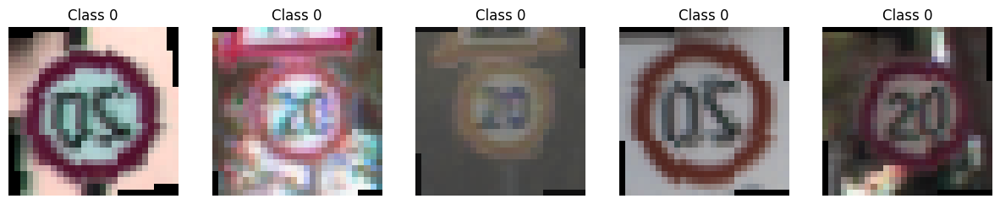

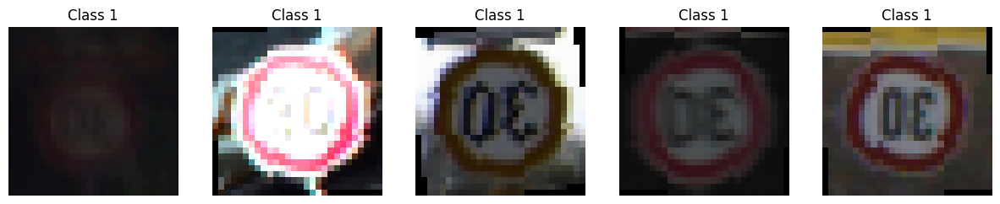

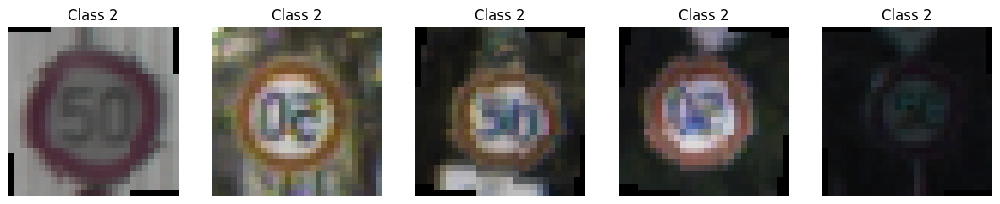

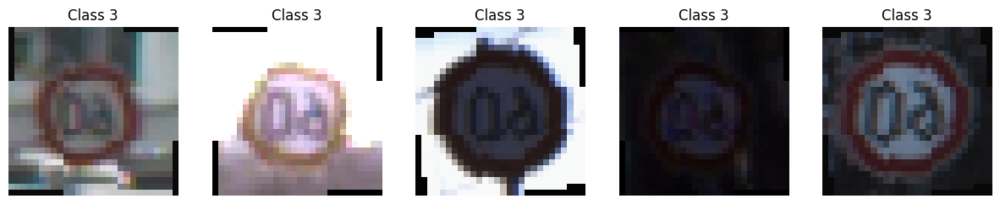

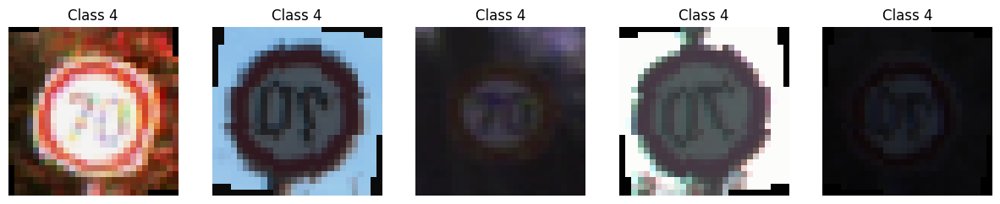

...

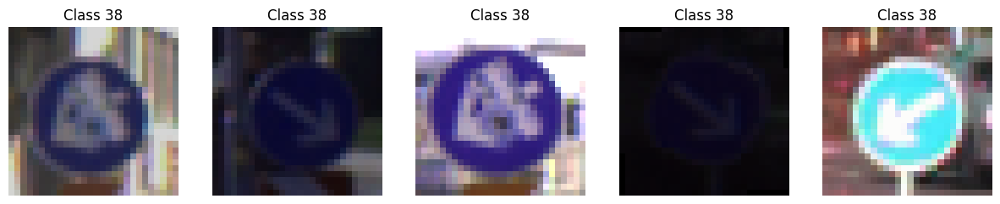

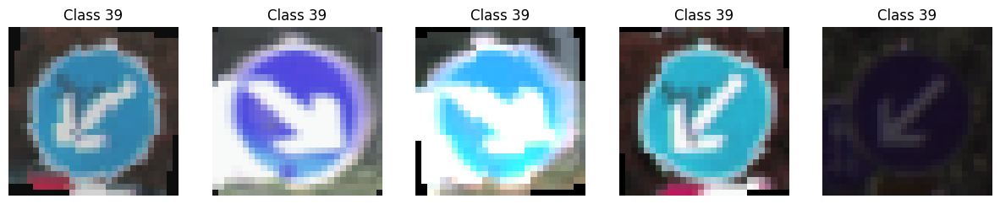

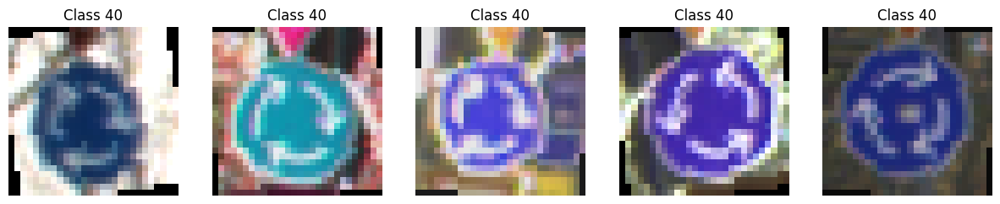

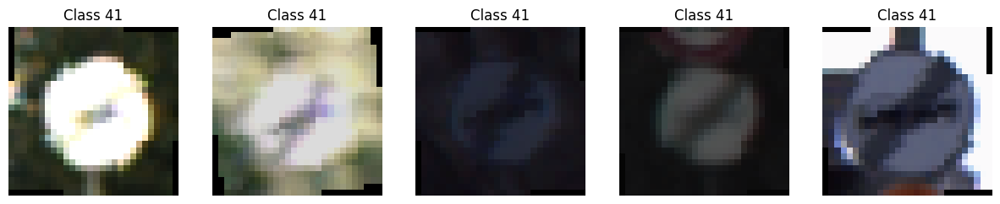

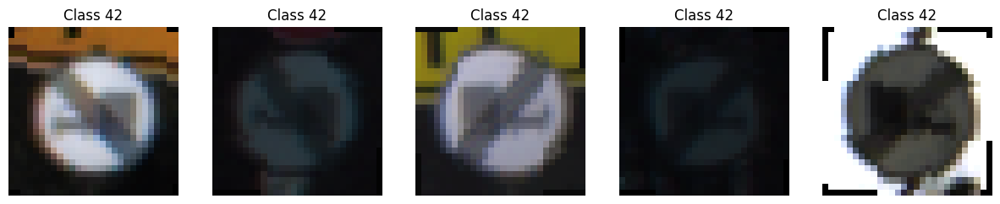

In [170]:
show_examples_all_classes(train_dataset, class_to_indices, n=5)

# Convolutional Neural Networks (CNN) with Cross-Entropy Loss

## 1. Convolutional Neural Network (CNN)

A **Convolutional Neural Network (CNN)** is a type of deep learning model especially useful for image classification tasks.  
It automatically extracts features (edges, shapes, patterns) through convolutional layers instead of relying on manual feature engineering.  

### Key Components:
- **Convolutional Layers**: Apply filters (kernels) to capture local patterns such as edges or textures.
- **Pooling Layers**: Reduce spatial dimensions while retaining important information (e.g., MaxPooling).
- **Fully Connected Layers**: Combine extracted features to perform classification.
- **Activation Functions**: Non-linear transformations (e.g., ReLU) that introduce learning complexity.
- **Dropout / BatchNorm**: Regularization techniques to prevent overfitting.

---

## 2. Cross-Entropy Loss

For **multiclass classification**, we typically use **Cross-Entropy Loss**.  
It measures the difference between the predicted probability distribution (from softmax) and the true distribution (one-hot encoded labels).


Where:
- `C` = number of classes  
- `y_k` = true label (1 for correct class, 0 for others)  
- `ŷ_k` = predicted probability for class `k`  

The model learns by minimizing this loss function.




<img src="https://upload.wikimedia.org/wikipedia/commons/9/90/CNN-filter-animation-1.gif">

<img src="https://upload.wikimedia.org/wikipedia/commons/0/04/Convolution_arithmetic_-_Padding_strides.gif">

In [171]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [173]:
class TrafficSignCNN(nn.Module):
    def __init__(self, num_classes=43):
        super(TrafficSignCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)

        
        self.pool = nn.MaxPool2d(2,2)
        self.dropout = nn.Dropout(0.25)
        self.fc1 = None
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))

        x = x.view(x.size(0), -1)

        if self.fc1 is None:
            self.fc1 = nn.Linear(x.size(1), 256).to(x.device)

        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)
        return x

In [174]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = TrafficSignCNN(num_classes=43).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Entrega Actividad numero uno
## El estudiante deberá contestar las siguientes preguntas

1. ¿Mejora el rendimiento del modelo entrenar durante **20 épocas**? Resuma sus conclusiones.

    Para dar respuesta a esta pregunta, se deberá utilizar la funcion time, para calcular los tiempos de ejecución.

    Adicional se hara uso de la libreria pandas para dejar la tabla resultante de comparación 

    Se embebe en una sola función llamada invocefor_epoch la ejecución de las epocas, el objetivo es recibir por parametro el numero de epocas


In [175]:
import time
def invocefor_epoch(num_epochs, IndModelo=0, v_lr=0.001, Indnum_clases = 43):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = TrafficSignCNN(num_classes=Indnum_clases).to(device)
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []
    TimeEjecucion = []
    val_running_corrects_A , val_running_loss_A =[],[]
    criterion = nn.CrossEntropyLoss()
    
    if IndModelo == 1:
        optimizer = torch.optim.SGD(model.parameters(), lr=v_lr, momentum=0.9)
    else:
        optimizer = torch.optim.Adam(model.parameters(), lr=v_lr )      
        
    for epoch in range(num_epochs):
        start_time_ini = time.time()
        model.train()
        running_loss = 0.0
        running_corrects = 0
        total = 0

        for images, labels in tqdm(train_loader):
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += (preds == labels).sum().item()
            total += labels.size(0)

        epoch_loss = running_loss / total
        epoch_acc  = running_corrects / total

        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_acc)

        model.eval()
        val_running_loss = 0.0
        val_running_corrects = 0
        val_total = 0

        with torch.no_grad():
            for images, labels in tqdm(test_loader):
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_running_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                val_running_corrects += (preds == labels).sum().item()
                val_total += labels.size(0)

        
        val_running_corrects_A.append(val_running_corrects)
        val_running_loss_A.append(val_running_loss)
        val_loss = val_running_loss / val_total
        val_acc  = val_running_corrects / val_total


        end_time_ini = time.time()
        training_time_ini = end_time_ini - start_time_ini
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        TimeEjecucion.append({"Epoca": f" {num_epochs}", "TiempoInicial": start_time_ini, "TiempoFinal": end_time_ini, "TiempoEjecucion": training_time_ini})
        

    
    
    return train_losses, train_accuracies, val_losses, val_accuracies, val_running_corrects_A , val_running_loss_A , TimeEjecucion

In [176]:

def plot_metrics(train_losses_ini, train_accuracies_ini, val_losses_ini, val_accuracies_ini,
                 train_losses_pos, train_accuracies_pos, val_losses_pos, val_accuracies_pos,
                 val_running_corrects_ini, val_running_loss_ini,
                 val_running_corrects_pos, val_running_loss_pos,
                 num_epochs_ini, num_epochs_pos):
                

                plt.figure(figsize=(20,20))

                plt.subplot(2,2,1)
                plt.plot(train_losses_ini, label='Numero de Entrenamientos Perdidos con {} épocas'.format(num_epochs_ini))
                plt.plot(train_losses_pos, label='Numero de Entrenamientos Perdidos con {} épocas'.format(num_epochs_pos))
                plt.xlabel('Cantidad por épocas')
                plt.ylabel("Entrenamientos perdidos")
                plt.legend()
                plt.title("Figura (1). Entrenamientos Perdidos por épocas, comparación entre {} épocas  versus {}".format(num_epochs_ini, num_epochs_pos))


                plt.subplot(2,2,2)
                plt.plot(val_losses_ini, label='Valores Perdidos con {} épocas'.format(num_epochs_ini))
                plt.plot(val_losses_pos, label='Valores Perdidos con {} épocas'.format(num_epochs_pos))
                plt.xlabel('Cantidad de  épocas')
                plt.ylabel("Valores perdidos")
                plt.legend()
                plt.title("Figura (2). Valores perdidos por épocas, comparación entre {} épocas  versus {}".format(num_epochs_ini, num_epochs_pos))

                plt.subplot(2,2,3)
                plt.plot(train_accuracies_ini, label='Numero de Entrenamientos correctos con {} épocas'.format(num_epochs_ini) )
                plt.plot(train_accuracies_pos, label='Numero de Entrenamientos correctos con {} épocas'.format(num_epochs_pos))
                plt.xlabel('Cantidad de epocas')
                plt.ylabel("Entrenamientos Correctos")
                plt.legend()
                plt.title("Entrenamientos correctos por épocas" )
                plt.title("Figura(3). Entrenamientos correctos por épocas comparación entre {} épocas  versus {}".format(num_epochs_ini, num_epochs_pos))

                plt.subplot(2,2,4)
                plt.plot(val_accuracies_ini, label='Valores correctos con {} épocas'.format(num_epochs_ini))
                plt.plot(val_accuracies_pos, label='Valores perdidos con {} épocas'.format(num_epochs_pos))
                plt.xlabel('Cantidad de epocas')
                plt.ylabel("Valores Correctos")
                plt.legend()
                plt.title("Figura(4). Valores corectos por épocas comparación entre {} épocas  versus {}".format(num_epochs_ini, num_epochs_pos))


                plt.figure(figsize=(20,10))

                plt.subplot(2,2,1)
                plt.plot(val_running_corrects_ini, label='Valores  correctos por corrida con {} épocas'.format(num_epochs_ini))
                plt.plot(val_running_corrects_pos, label='Valores correctos por corrida con {} épocas'.format(num_epochs_pos))
                plt.xlabel("Valores correctos por corrida para {} epocas".format(num_epochs_ini))
                plt.ylabel("Valores correctos por corrida para {} epocas".format(num_epochs_pos))
                plt.legend()
                plt.title("Figura (5). Valores corridos correctos por épocas" )


                plt.subplot(2,2,2)
                plt.plot(val_running_loss_ini, label='Valores perdidos por corrida con {} épocas'.format(num_epochs_ini))
                plt.plot(val_running_loss_pos, label='Valores perdidos por corrida con {} épocas'.format(num_epochs_pos))
                plt.xlabel('Valores correctos por corrida para {} epocas'.format(num_epochs_ini))
                plt.ylabel("Valores perdidos por corrida para {} epocas".format(num_epochs_pos))
                plt.legend()
                plt.title("Figura(6).Valores perdidos por corrida por épocas ")





                plt.show()

In [177]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


def make_confusion_matrix_new(loader, stage='train'):
    all_preds = []
    all_labels = []

    model.eval()
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    fig, ax = plt.subplots(figsize=(50,50))
    disp.plot(cmap=plt.cm.Blues,ax=ax, xticks_rotation='vertical')
    for text in ax.texts:
        text.set_fontsize(20)

    ax.tick_params(axis='x', labelsize=20 )
    ax.tick_params(axis='y', labelsize=20 )
    ax.set_title('Matriz de confusión para la etapa de {}'.format('Train' if stage == 'train' else 'Test'), fontsize=30)

    plt.show()


## Vamos a invocar utilizando un canal de 128 

100%|██████████| 99/99 [00:03<00:00, 30.88it/s]


El maximo de valores perdidos por entrenamiento  para 10  epocas fue: 2.4041499013838004 y el maximo para 20 fue  de : 2.2833942118816943
El maximo de valores correctos por entrenamiento para 10 epocas fue: 0.945242163788926  y el maximo para 20 fue  de : 0.9726338340687087
Tiempo de entrenamiento con 10 épocas: 274.32 segundos
Tiempo de entrenamiento con 20 épocas: 552.90 segundos
La diferencia de tiempo de entrenamiento entre 20 y 10 épocas, es de : -278.58 segundos


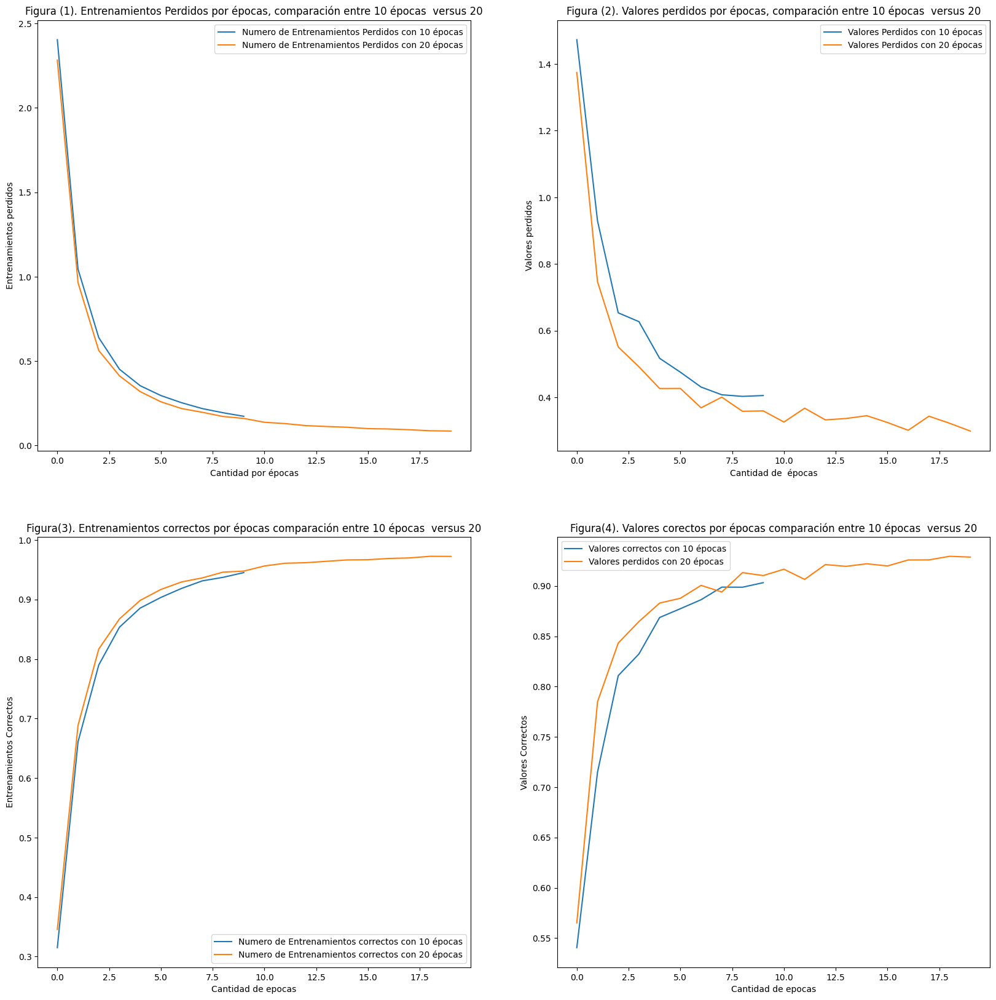

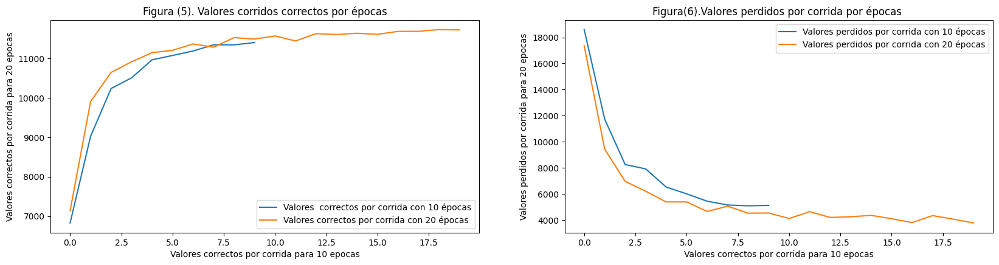

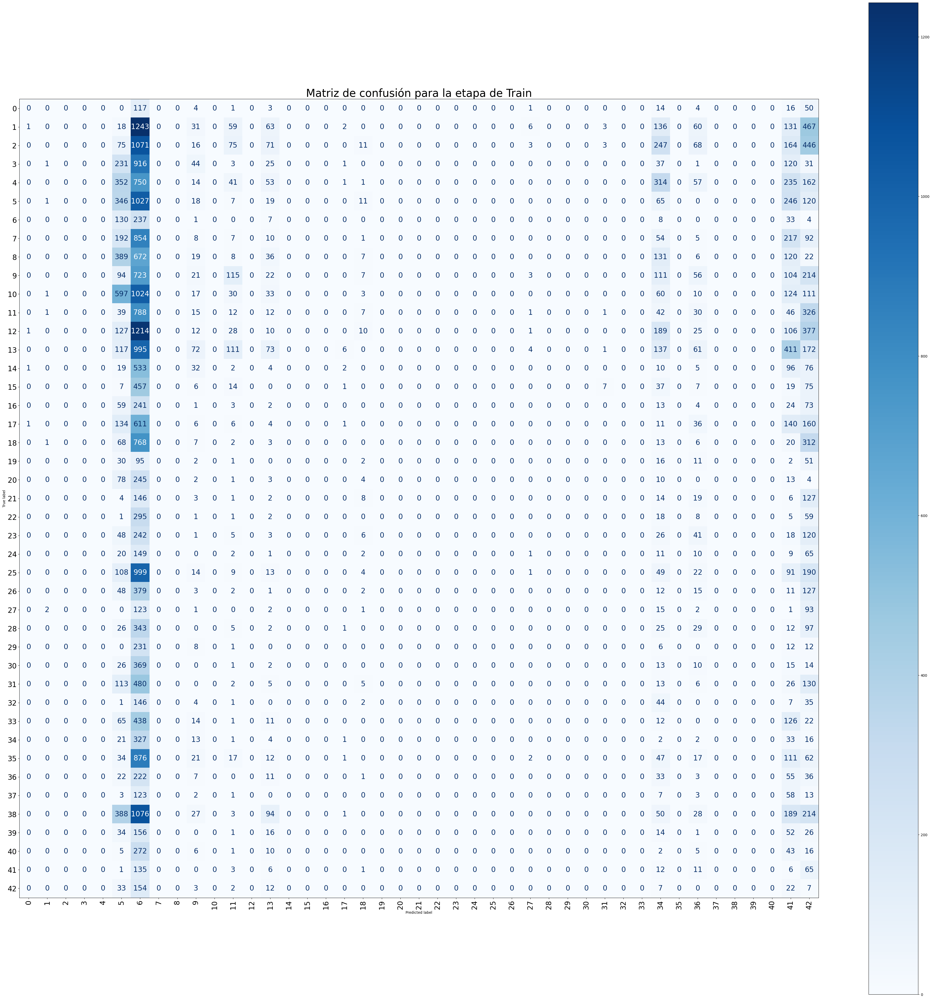

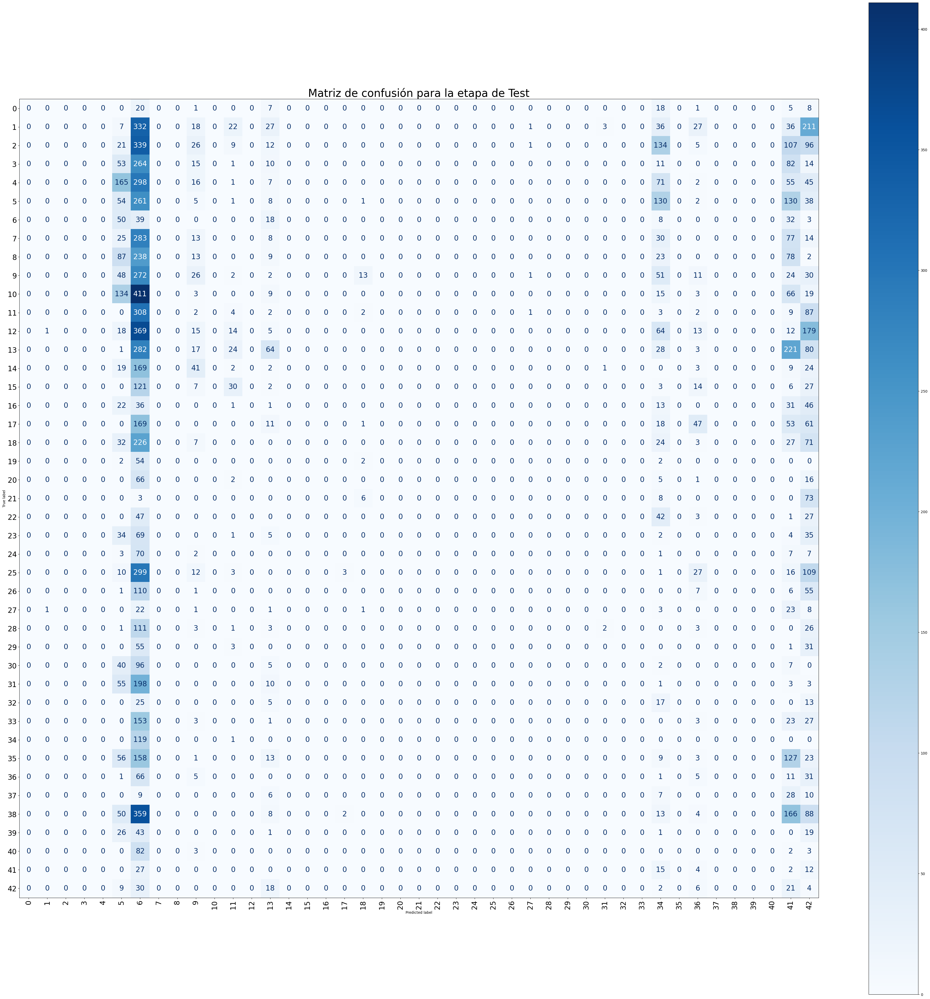

Proceso terminado para un. VLR = 0.001
inicia proceso para un. VLR = 0.009


100%|██████████| 99/99 [00:03<00:00, 31.02it/s]


El maximo de valores perdidos por entrenamiento  para 10  epocas fue: 2.036949673252684 y el maximo para 20 fue  de : 1.703767918622826
El maximo de valores correctos por entrenamiento para 10 epocas fue: 0.8778851794230916  y el maximo para 20 fue  de : 0.9001504756560994
Tiempo de entrenamiento con 10 épocas: 674.85 segundos
Tiempo de entrenamiento con 20 épocas: 667.47 segundos
La diferencia de tiempo de entrenamiento entre 20 y 10 épocas, es de : 7.38 segundos


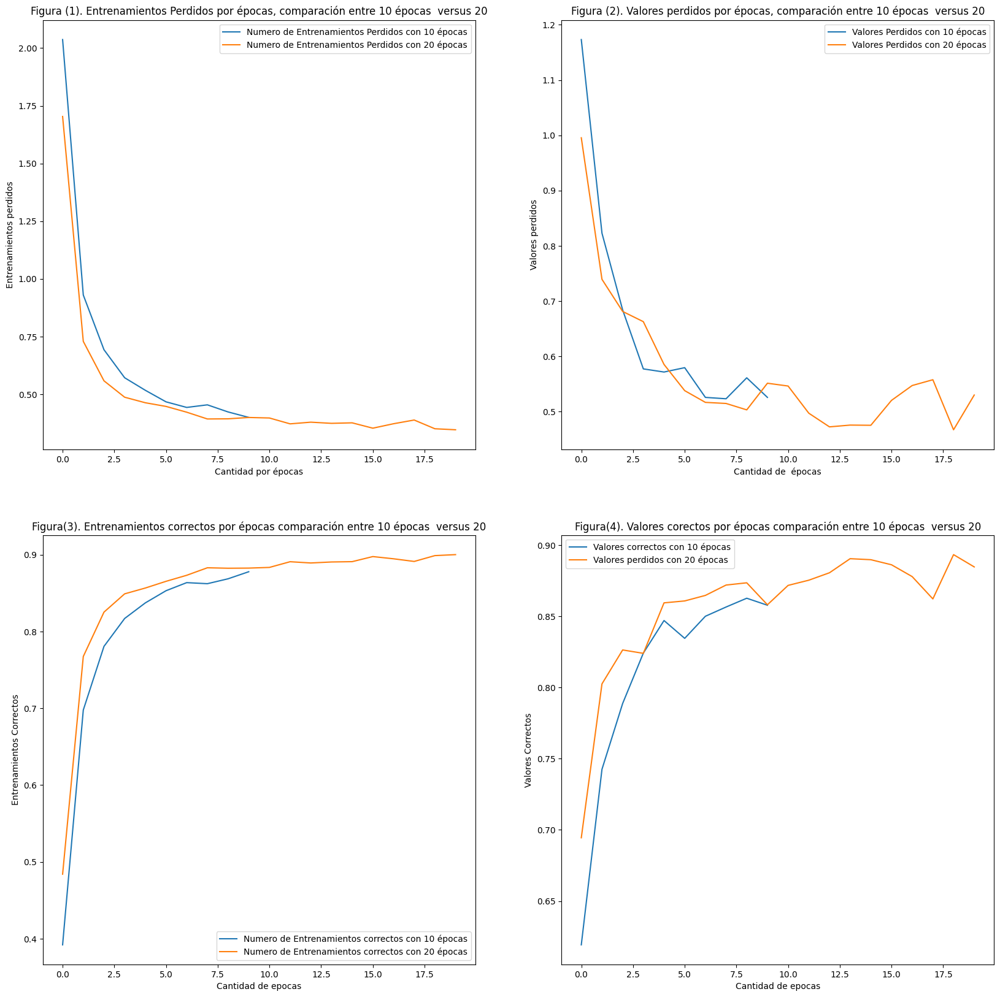

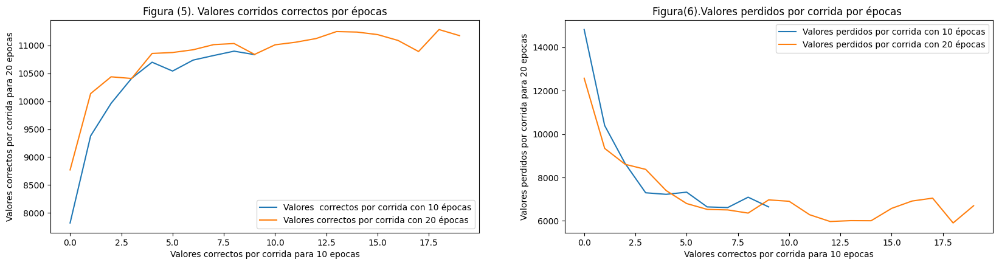

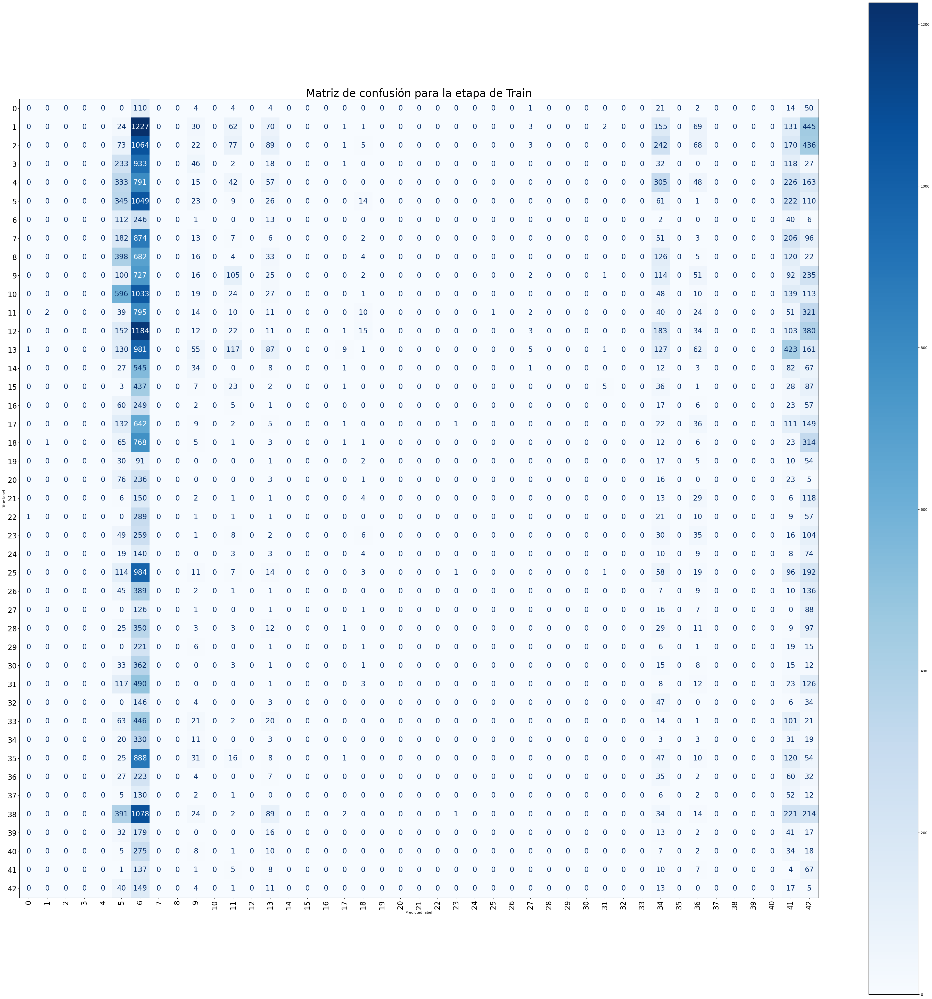

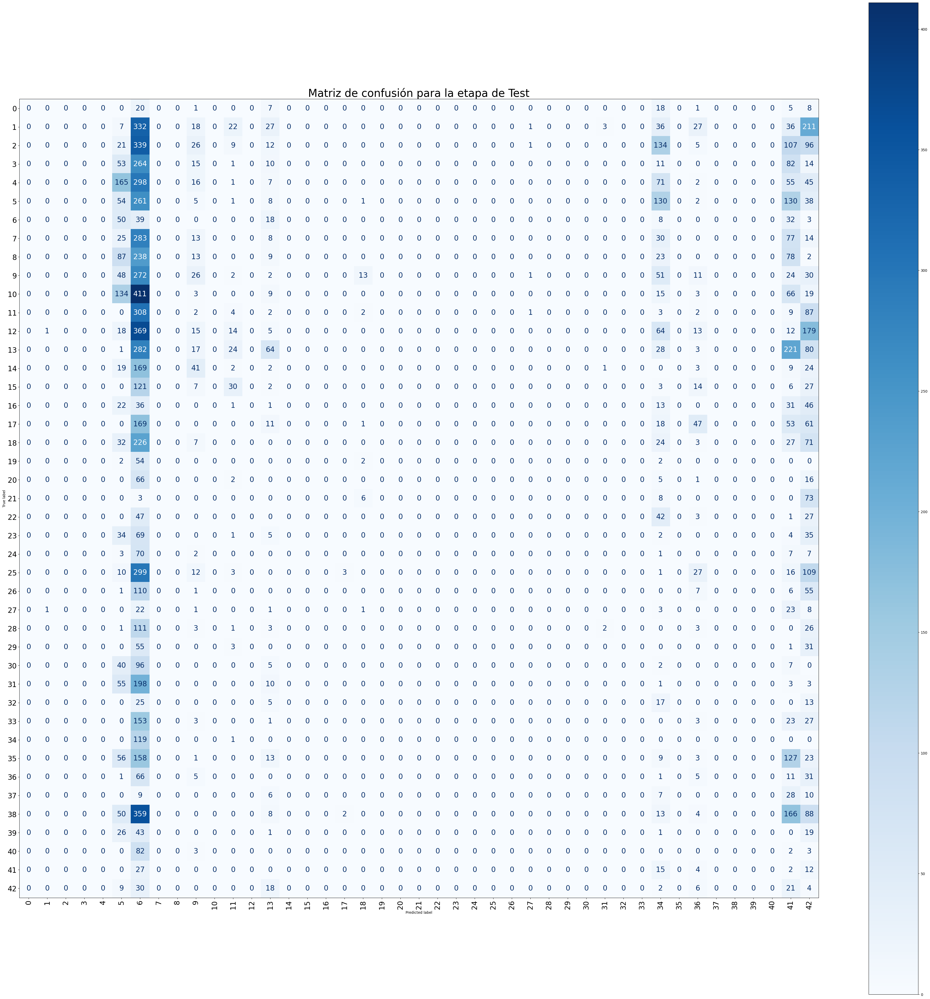

Proceso terminado para un. VLR = 0.009


In [163]:
import time
import matplotlib.pyplot as plt
import numpy as np

start_time_ini = time.time()

num_epochs_ini = 10
train_losses_ini, train_accuracies_ini, val_losses_ini, val_accuracies_ini, val_running_corrects_ini , val_running_loss_ini , TimeEjecucion_ini=invocefor_epoch(num_epochs_ini, IndModelo=0, v_lr=0.001, Indnum_clases=43)
end_time_ini = time.time()
training_time_ini = end_time_ini - start_time_ini

start_time_pos = time.time()
num_epochs_pos = 20
train_losses_pos, train_accuracies_pos, val_losses_pos, val_accuracies_pos, val_running_corrects_pos , val_running_loss_pos,TimeEjecucion_pos =invocefor_epoch(num_epochs_pos, IndModelo=0, v_lr=0.001, Indnum_clases=43)
end_time_pos = time.time()
training_time_pos = end_time_pos - start_time_pos
training_time_total = training_time_ini - training_time_pos




print (f"El maximo de valores perdidos por entrenamiento  para {num_epochs_ini}  epocas fue: {max(train_losses_ini)} y el maximo para {num_epochs_pos} fue  de : {max(train_losses_pos)}")
print (f"El maximo de valores correctos por entrenamiento para {num_epochs_ini} epocas fue: {max(train_accuracies_ini)}  y el maximo para {num_epochs_pos} fue  de : {max(train_accuracies_pos)}")
print(f"Tiempo de entrenamiento con {num_epochs_ini} épocas: {training_time_ini:.2f} segundos")
print(f"Tiempo de entrenamiento con {num_epochs_pos} épocas: {training_time_pos:.2f} segundos")
print(f"La diferencia de tiempo de entrenamiento entre {num_epochs_pos} y {num_epochs_ini} épocas, es de : {training_time_total:.2f} segundos")


plot_metrics(train_losses_ini, train_accuracies_ini, val_losses_ini, val_accuracies_ini,
             train_losses_pos, train_accuracies_pos, val_losses_pos, val_accuracies_pos,
             val_running_corrects_ini, val_running_loss_ini,
             val_running_corrects_pos, val_running_loss_pos,
             num_epochs_ini, num_epochs_pos)

make_confusion_matrix_new(train_loader ,'train')
make_confusion_matrix_new(test_loader, 'test')


print ("Proceso terminado para un. VLR = 0.001")


print ("inicia proceso para un. VLR = 0.009")


start_time_ini = time.time()

num_epochs_ini = 10
train_losses_ini, train_accuracies_ini, val_losses_ini, val_accuracies_ini, val_running_corrects_ini , val_running_loss_ini , TimeEjecucion_ini=invocefor_epoch(num_epochs_ini, IndModelo=0, v_lr=0.009, Indnum_clases=43)
end_time_ini = time.time()
training_time_ini = end_time_ini - start_time_ini

start_time_pos = time.time()
num_epochs_pos = 20
train_losses_pos, train_accuracies_pos, val_losses_pos, val_accuracies_pos, val_running_corrects_pos , val_running_loss_pos,TimeEjecucion_pos =invocefor_epoch(num_epochs_pos, IndModelo=0, v_lr=0.009, Indnum_clases=43)
end_time_pos = time.time()
training_time_pos = end_time_pos - start_time_pos
training_time_total = training_time_ini - training_time_pos




print (f"El maximo de valores perdidos por entrenamiento  para {num_epochs_ini}  epocas fue: {max(train_losses_ini)} y el maximo para {num_epochs_pos} fue  de : {max(train_losses_pos)}")
print (f"El maximo de valores correctos por entrenamiento para {num_epochs_ini} epocas fue: {max(train_accuracies_ini)}  y el maximo para {num_epochs_pos} fue  de : {max(train_accuracies_pos)}")
print(f"Tiempo de entrenamiento con {num_epochs_ini} épocas: {training_time_ini:.2f} segundos")
print(f"Tiempo de entrenamiento con {num_epochs_pos} épocas: {training_time_pos:.2f} segundos")
print(f"La diferencia de tiempo de entrenamiento entre {num_epochs_pos} y {num_epochs_ini} épocas, es de : {training_time_total:.2f} segundos")


plot_metrics(train_losses_ini, train_accuracies_ini, val_losses_ini, val_accuracies_ini,
             train_losses_pos, train_accuracies_pos, val_losses_pos, val_accuracies_pos,
             val_running_corrects_ini, val_running_loss_ini,
             val_running_corrects_pos, val_running_loss_pos,
             num_epochs_ini, num_epochs_pos)

make_confusion_matrix_new(train_loader ,'train')
make_confusion_matrix_new(test_loader, 'test')


print ("Proceso terminado para un. VLR = 0.009")



## Vamos a utilizar el mismo codigo , pero ahora cambiando de canal, pasando de 128 a 64 

100%|██████████| 198/198 [00:03<00:00, 59.69it/s]


El maximo de valores perdidos por entrenamiento  para 10  epocas fue: 1.952566100235859 y el maximo para 20 fue  de : 2.0122991707425375
El maximo de valores correctos por entrenamiento para 10 epocas fue: 0.9565405901706241  y el maximo para 20 fue  de : 0.9745211558570737
Tiempo de entrenamiento con 10 épocas: 1251.44 segundos
Tiempo de entrenamiento con 20 épocas: 2017.99 segundos
La diferencia de tiempo de entrenamiento entre 20 y 10 épocas, es de : -766.56 segundos


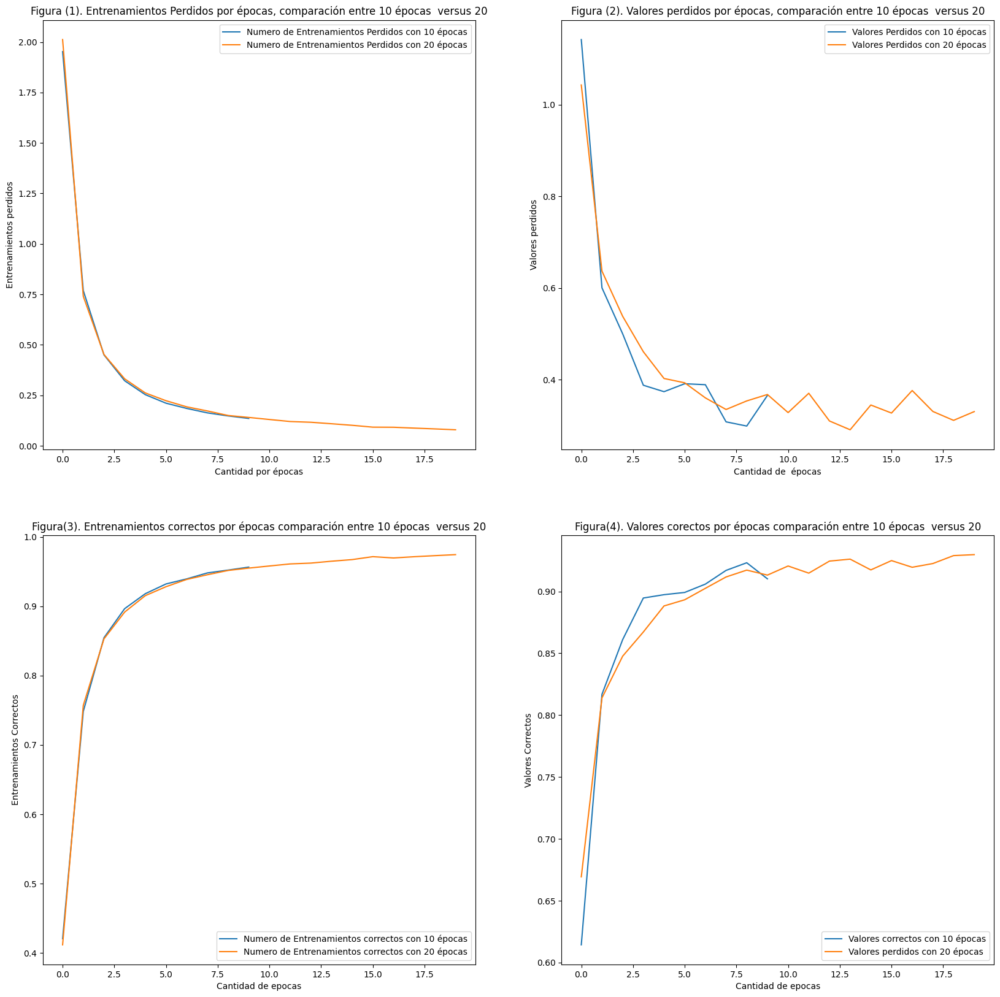

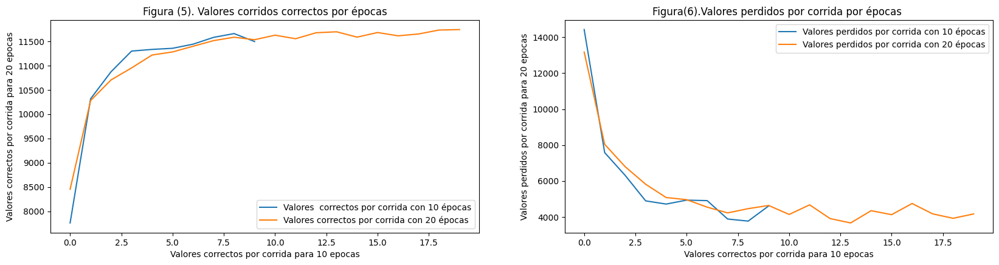

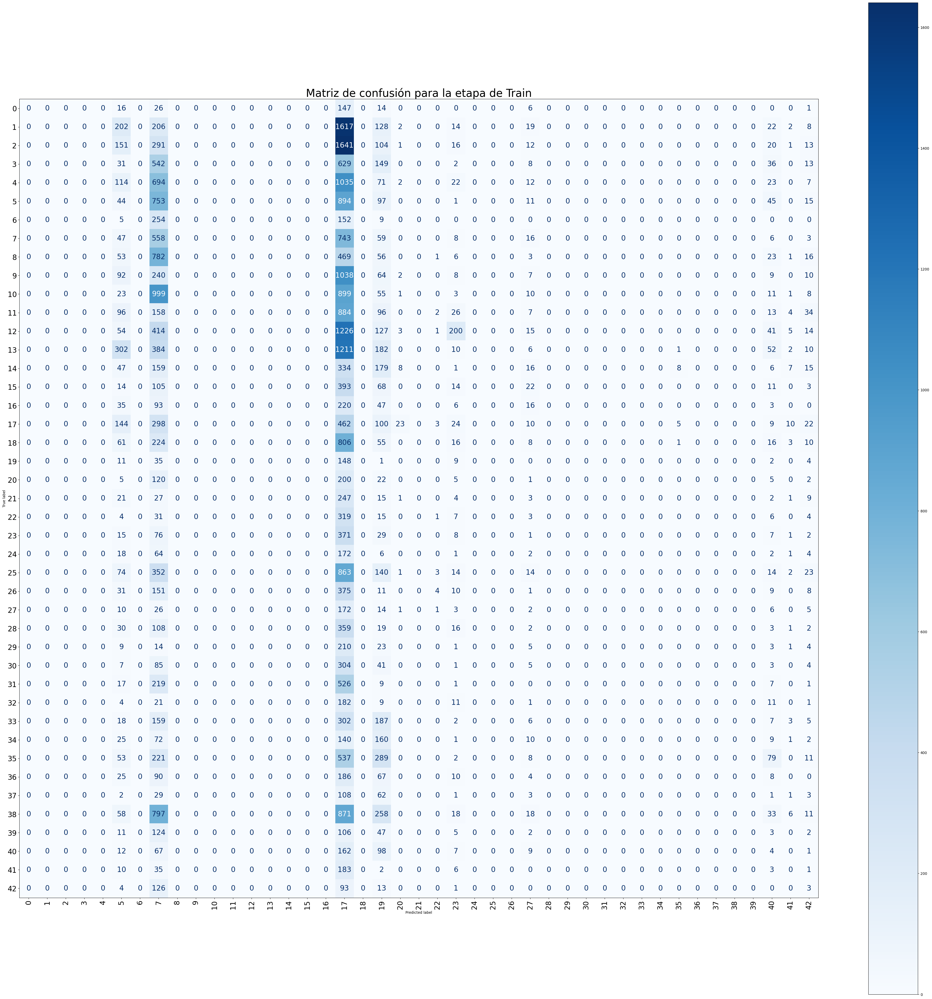

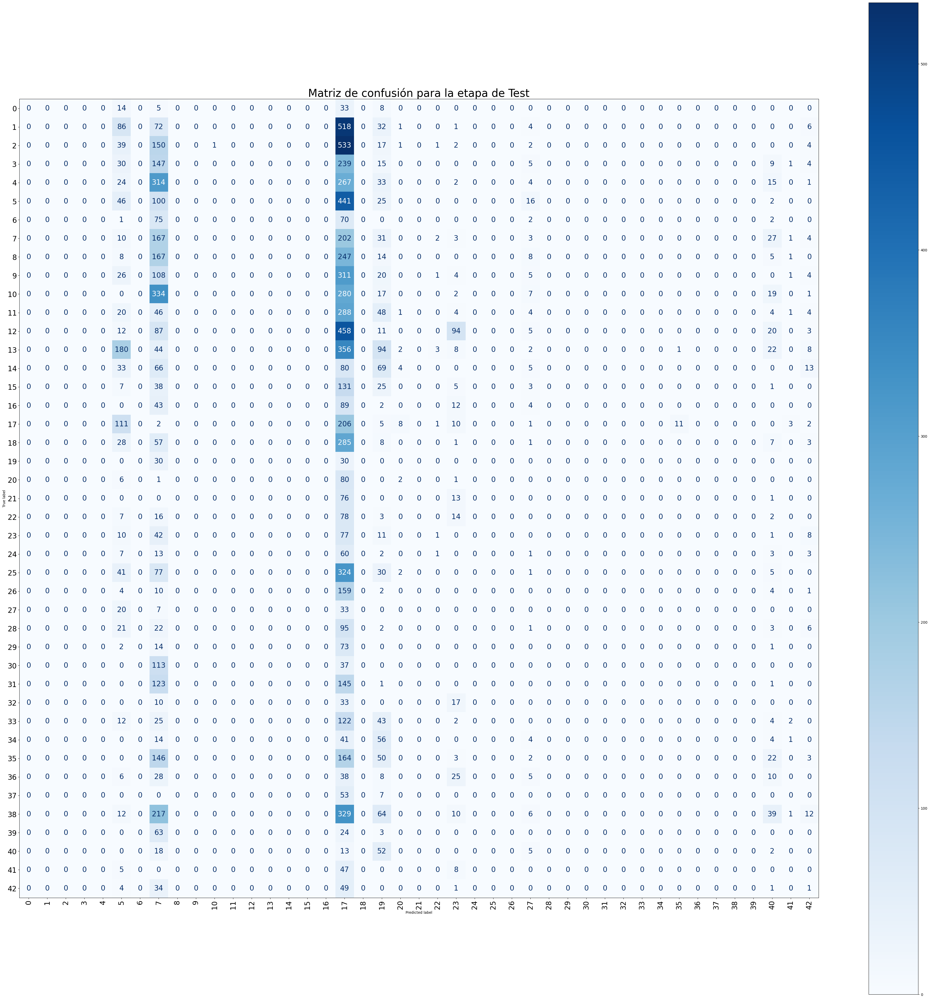

Proceso terminado para un. VLR = 0.001
inicia proceso para un. VLR = 0.009


100%|██████████| 198/198 [00:03<00:00, 60.05it/s]


El maximo de valores perdidos por entrenamiento  para 10  epocas fue: 1.7206784101876855 y el maximo para 20 fue  de : 1.7156022788979137
El maximo de valores correctos por entrenamiento para 10 epocas fue: 0.8530184396439593  y el maximo para 20 fue  de : 0.875589788058864
Tiempo de entrenamiento con 10 épocas: 604.17 segundos
Tiempo de entrenamiento con 20 épocas: 2411.14 segundos
La diferencia de tiempo de entrenamiento entre 20 y 10 épocas, es de : -1806.97 segundos


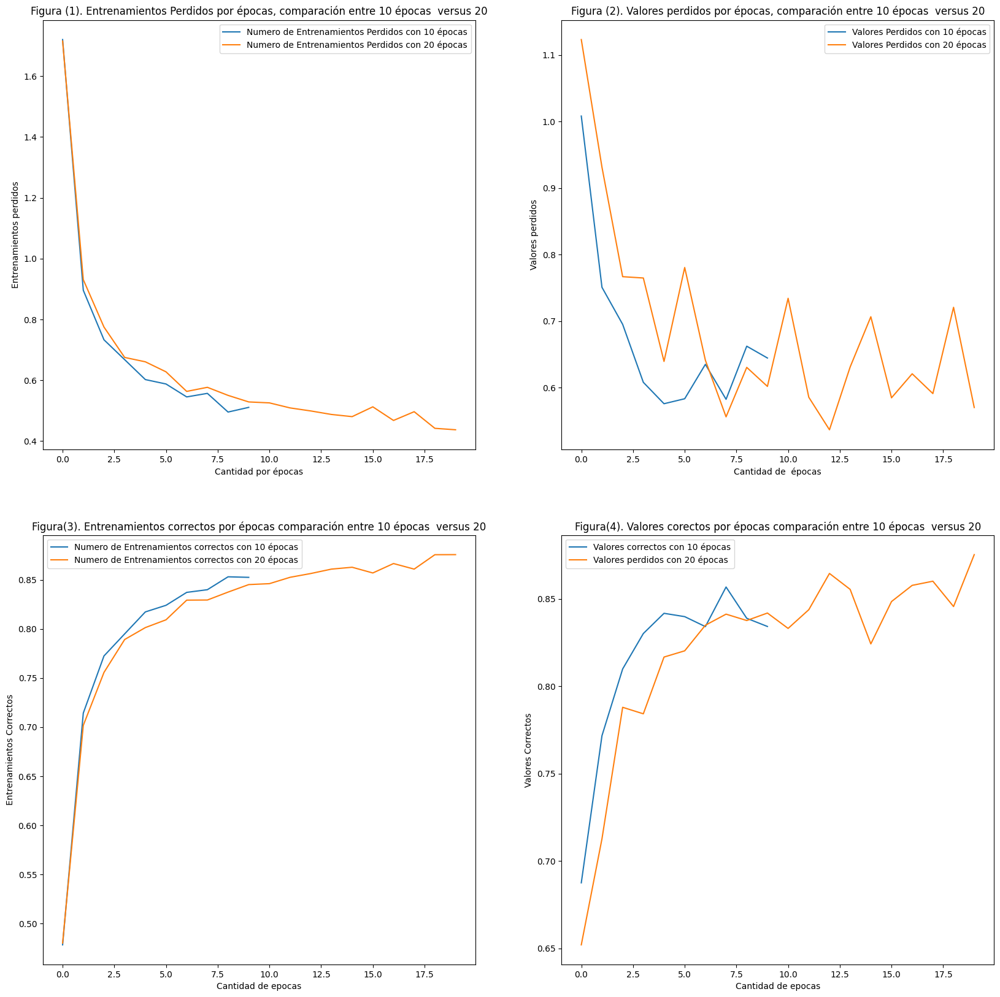

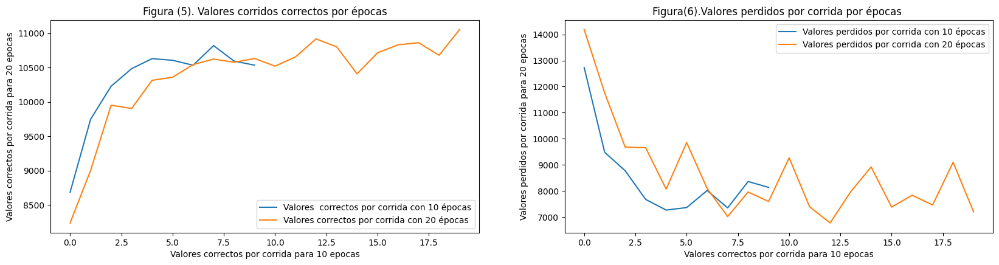

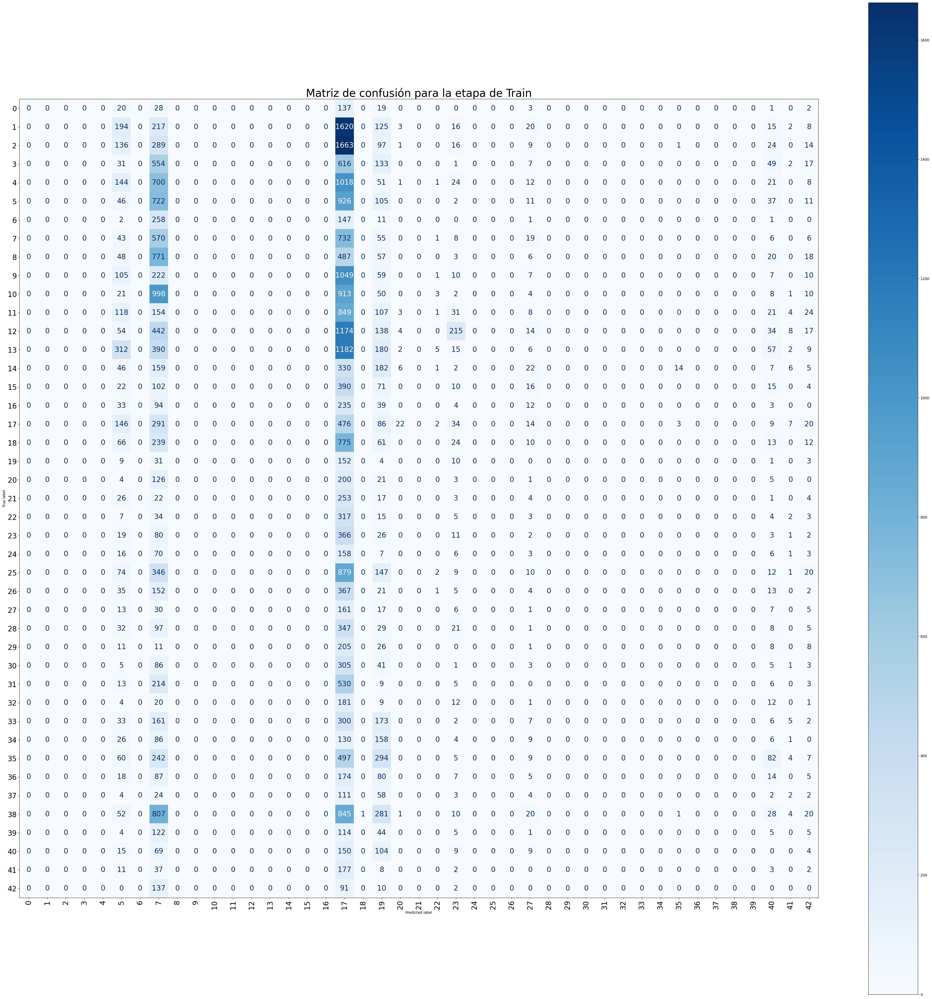

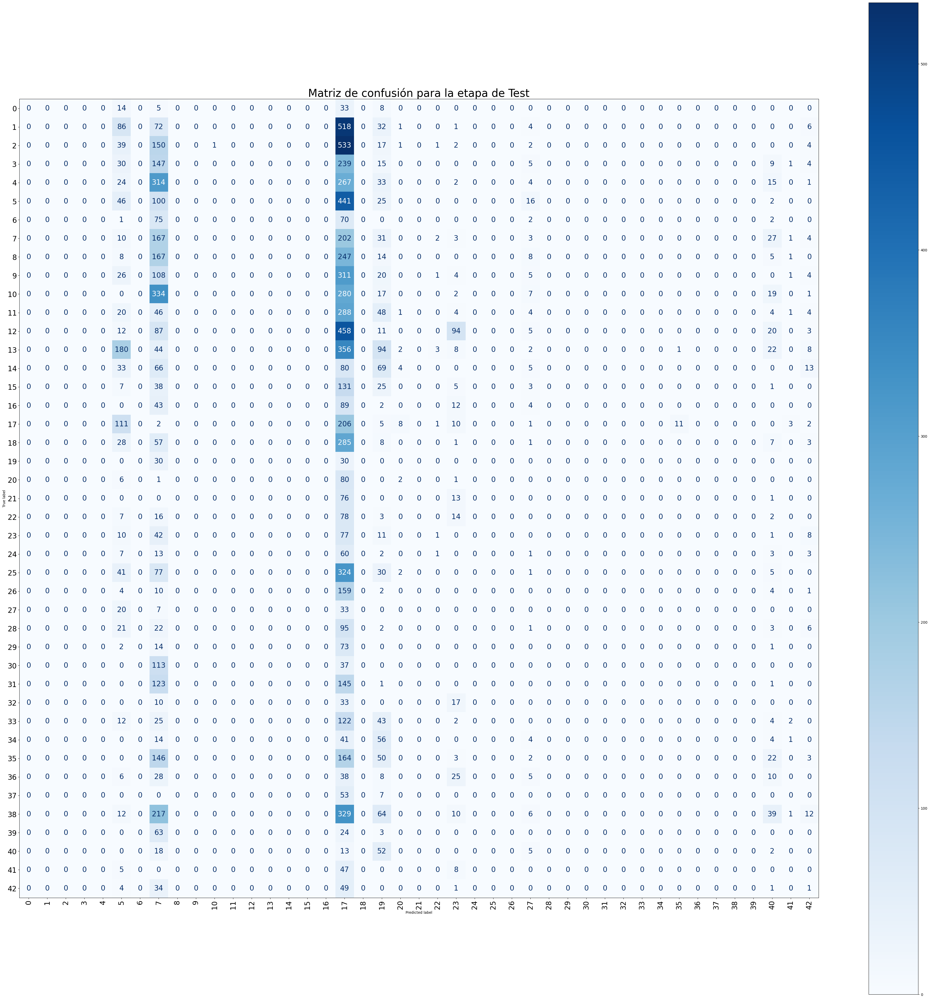

Proceso terminado para un. VLR = 0.009


In [178]:
import time
import matplotlib.pyplot as plt
import numpy as np

start_time_ini = time.time()

num_epochs_ini = 10
train_losses_ini, train_accuracies_ini, val_losses_ini, val_accuracies_ini, val_running_corrects_ini , val_running_loss_ini , TimeEjecucion_ini=invocefor_epoch(num_epochs_ini, IndModelo=0, v_lr=0.001, Indnum_clases=43)
end_time_ini = time.time()
training_time_ini = end_time_ini - start_time_ini

start_time_pos = time.time()
num_epochs_pos = 20
train_losses_pos, train_accuracies_pos, val_losses_pos, val_accuracies_pos, val_running_corrects_pos , val_running_loss_pos,TimeEjecucion_pos =invocefor_epoch(num_epochs_pos, IndModelo=0, v_lr=0.001, Indnum_clases=43)
end_time_pos = time.time()
training_time_pos = end_time_pos - start_time_pos
training_time_total = training_time_ini - training_time_pos




print (f"El maximo de valores perdidos por entrenamiento  para {num_epochs_ini}  epocas fue: {max(train_losses_ini)} y el maximo para {num_epochs_pos} fue  de : {max(train_losses_pos)}")
print (f"El maximo de valores correctos por entrenamiento para {num_epochs_ini} epocas fue: {max(train_accuracies_ini)}  y el maximo para {num_epochs_pos} fue  de : {max(train_accuracies_pos)}")
print(f"Tiempo de entrenamiento con {num_epochs_ini} épocas: {training_time_ini:.2f} segundos")
print(f"Tiempo de entrenamiento con {num_epochs_pos} épocas: {training_time_pos:.2f} segundos")
print(f"La diferencia de tiempo de entrenamiento entre {num_epochs_pos} y {num_epochs_ini} épocas, es de : {training_time_total:.2f} segundos")


plot_metrics(train_losses_ini, train_accuracies_ini, val_losses_ini, val_accuracies_ini,
             train_losses_pos, train_accuracies_pos, val_losses_pos, val_accuracies_pos,
             val_running_corrects_ini, val_running_loss_ini,
             val_running_corrects_pos, val_running_loss_pos,
             num_epochs_ini, num_epochs_pos)

make_confusion_matrix_new(train_loader ,'train')
make_confusion_matrix_new(test_loader, 'test')


print ("Proceso terminado para un. VLR = 0.001")


print ("inicia proceso para un. VLR = 0.009")


start_time_ini = time.time()

num_epochs_ini = 10
train_losses_ini, train_accuracies_ini, val_losses_ini, val_accuracies_ini, val_running_corrects_ini , val_running_loss_ini , TimeEjecucion_ini=invocefor_epoch(num_epochs_ini, IndModelo=0, v_lr=0.009, Indnum_clases=43)
end_time_ini = time.time()
training_time_ini = end_time_ini - start_time_ini

start_time_pos = time.time()
num_epochs_pos = 20
train_losses_pos, train_accuracies_pos, val_losses_pos, val_accuracies_pos, val_running_corrects_pos , val_running_loss_pos,TimeEjecucion_pos =invocefor_epoch(num_epochs_pos, IndModelo=0, v_lr=0.009, Indnum_clases=43)
end_time_pos = time.time()
training_time_pos = end_time_pos - start_time_pos
training_time_total = training_time_ini - training_time_pos




print (f"El maximo de valores perdidos por entrenamiento  para {num_epochs_ini}  epocas fue: {max(train_losses_ini)} y el maximo para {num_epochs_pos} fue  de : {max(train_losses_pos)}")
print (f"El maximo de valores correctos por entrenamiento para {num_epochs_ini} epocas fue: {max(train_accuracies_ini)}  y el maximo para {num_epochs_pos} fue  de : {max(train_accuracies_pos)}")
print(f"Tiempo de entrenamiento con {num_epochs_ini} épocas: {training_time_ini:.2f} segundos")
print(f"Tiempo de entrenamiento con {num_epochs_pos} épocas: {training_time_pos:.2f} segundos")
print(f"La diferencia de tiempo de entrenamiento entre {num_epochs_pos} y {num_epochs_ini} épocas, es de : {training_time_total:.2f} segundos")


plot_metrics(train_losses_ini, train_accuracies_ini, val_losses_ini, val_accuracies_ini,
             train_losses_pos, train_accuracies_pos, val_losses_pos, val_accuracies_pos,
             val_running_corrects_ini, val_running_loss_ini,
             val_running_corrects_pos, val_running_loss_pos,
             num_epochs_ini, num_epochs_pos)

make_confusion_matrix_new(train_loader ,'train')
make_confusion_matrix_new(test_loader, 'test')


print ("Proceso terminado para un. VLR = 0.009")



## Vamos a utilizar un canal  64 para cambiando al modelo de SGD 

100%|██████████| 198/198 [00:05<00:00, 39.02it/s]


El maximo de valores perdidos por entrenamiento  para 10  epocas fue: 3.5516578238438914 y el maximo para 20 fue  de : 3.543193165505409
El maximo de valores correctos por entrenamiento para 10 epocas fue: 0.6201892422658063  y el maximo para 20 fue  de : 0.8080287689050983
Tiempo de entrenamiento con 10 épocas: 5026.50 segundos
Tiempo de entrenamiento con 20 épocas: 15688.63 segundos
La diferencia de tiempo de entrenamiento entre 20 y 10 épocas, es de : -10662.13 segundos


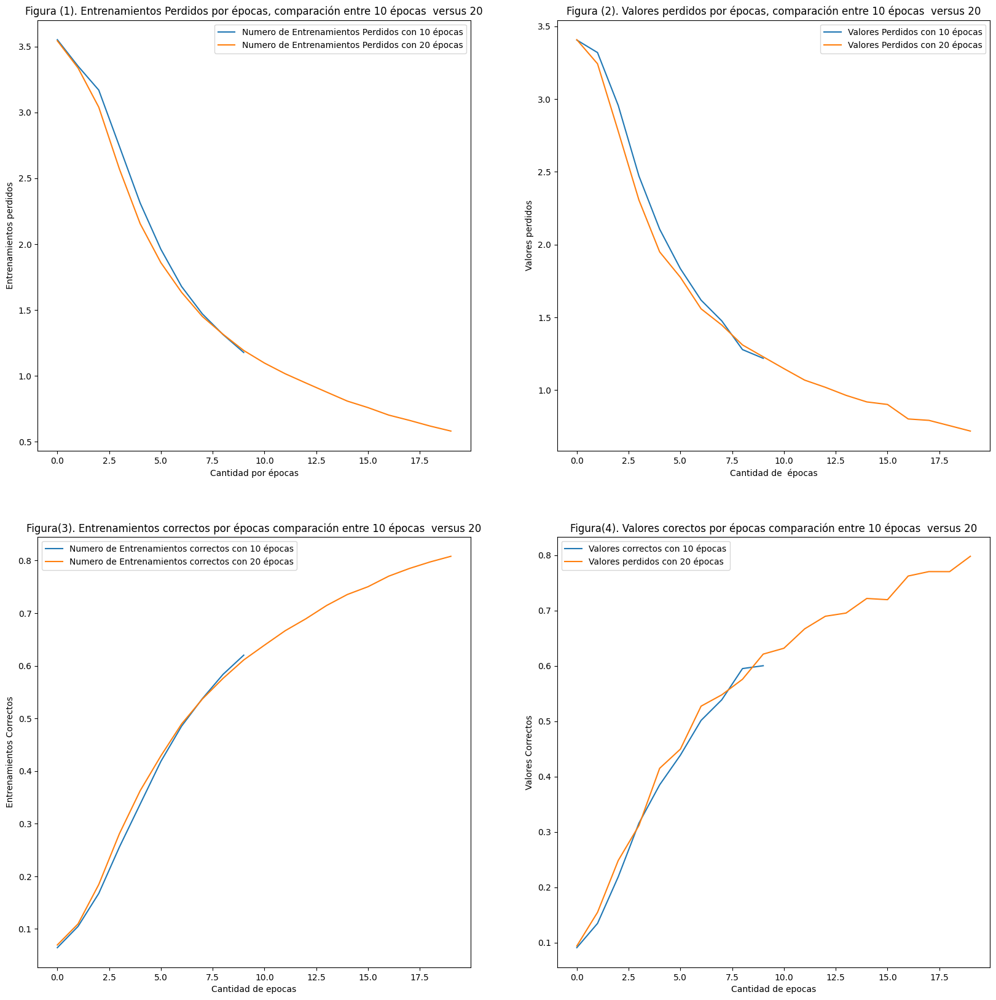

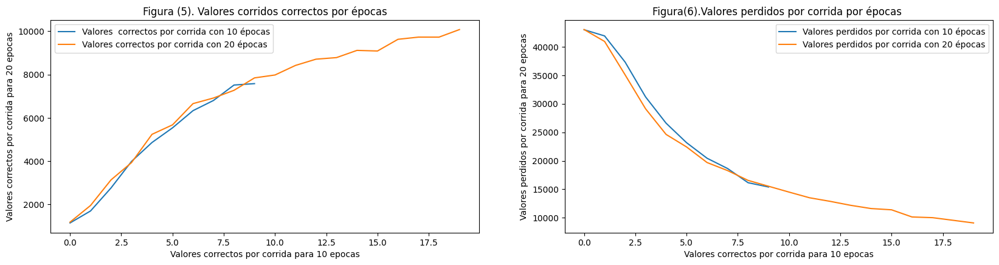

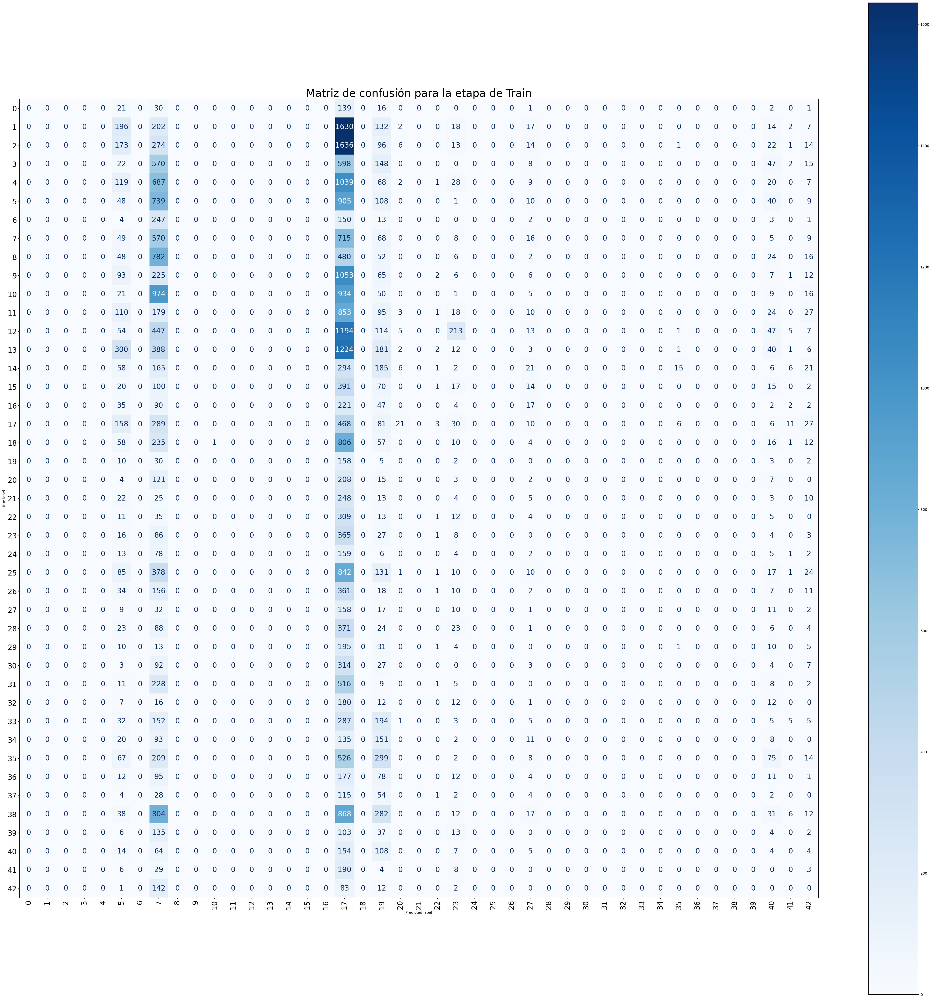

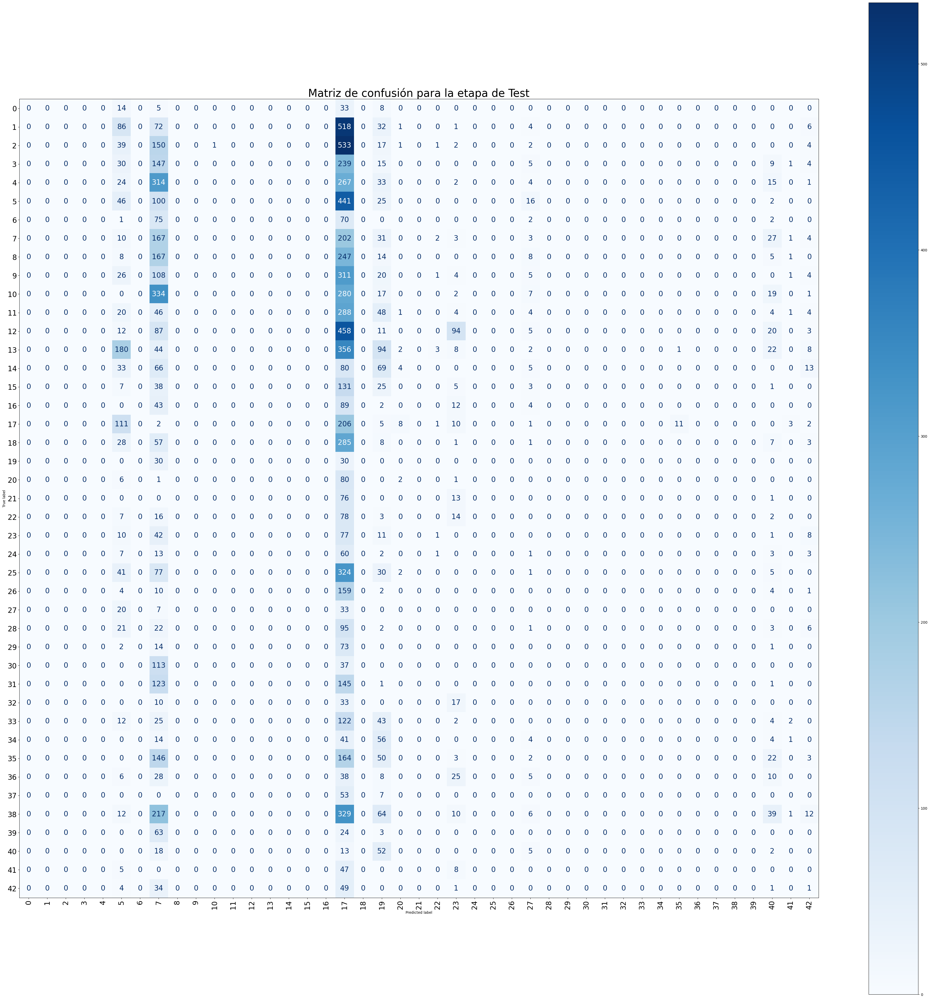

Proceso terminado para un. VLR = 0.001
inicia proceso para un. VLR = 0.009


100%|██████████| 198/198 [00:05<00:00, 37.37it/s]


El maximo de valores perdidos por entrenamiento  para 10  epocas fue: 2.790853285996842 y el maximo para 20 fue  de : 2.64115757872758
El maximo de valores correctos por entrenamiento para 10 epocas fue: 0.9465428855619883  y el maximo para 20 fue  de : 0.9744701471600908
Tiempo de entrenamiento con 10 épocas: 9212.63 segundos
Tiempo de entrenamiento con 20 épocas: 15389.16 segundos
La diferencia de tiempo de entrenamiento entre 20 y 10 épocas, es de : -6176.53 segundos


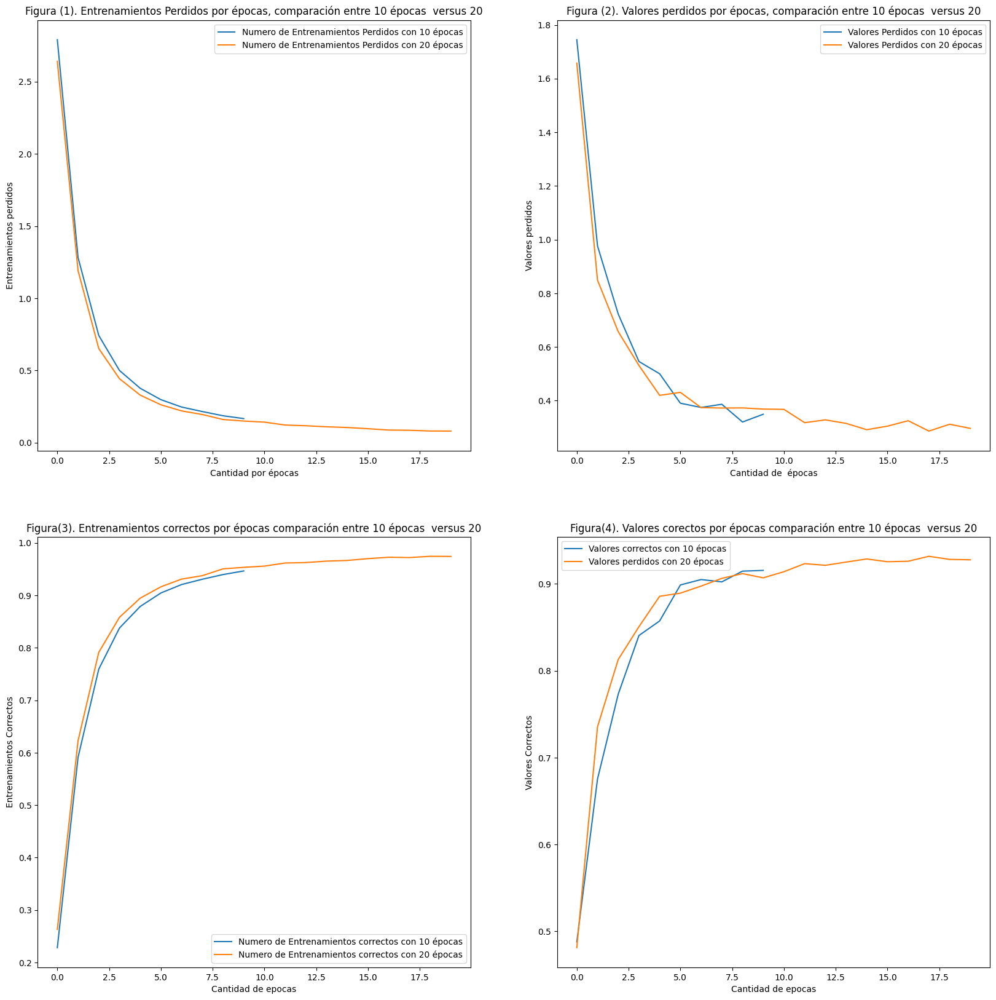

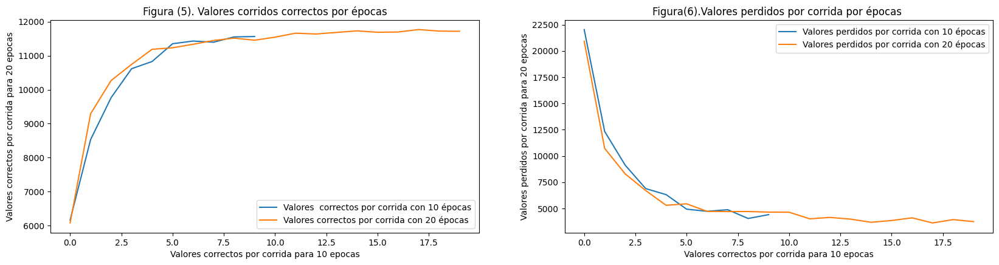

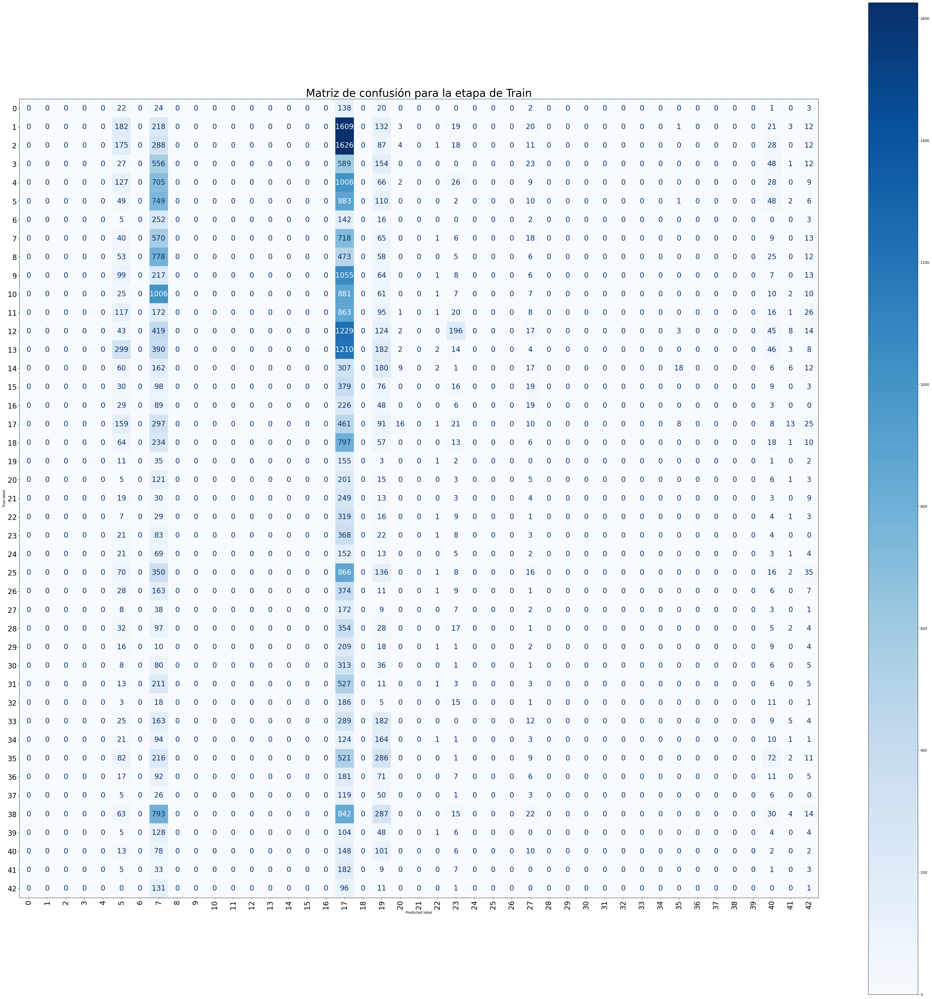

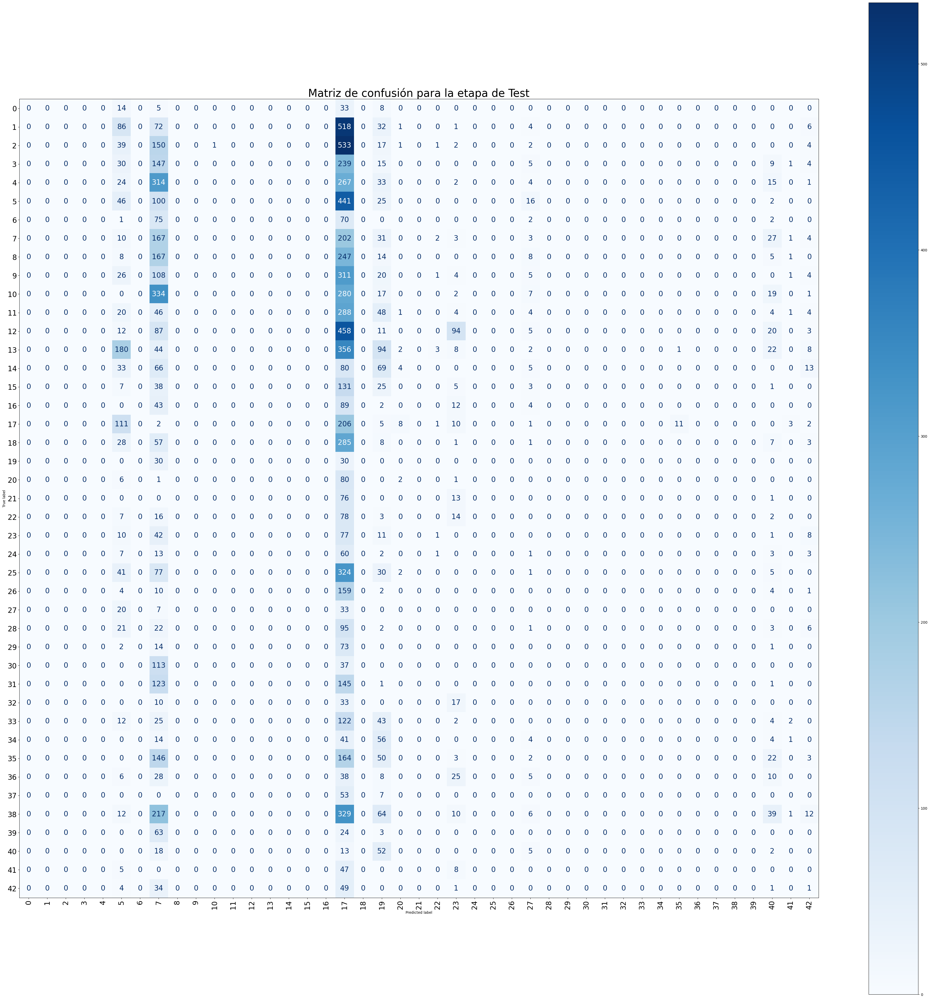

Proceso terminado para un. VLR = 0.009


In [179]:
import time
import matplotlib.pyplot as plt
import numpy as np

start_time_ini = time.time()

num_epochs_ini = 10
train_losses_ini, train_accuracies_ini, val_losses_ini, val_accuracies_ini, val_running_corrects_ini , val_running_loss_ini , TimeEjecucion_ini=invocefor_epoch(num_epochs_ini, IndModelo=1, v_lr=0.001, Indnum_clases=43)
end_time_ini = time.time()
training_time_ini = end_time_ini - start_time_ini

start_time_pos = time.time()
num_epochs_pos = 20
train_losses_pos, train_accuracies_pos, val_losses_pos, val_accuracies_pos, val_running_corrects_pos , val_running_loss_pos,TimeEjecucion_pos =invocefor_epoch(num_epochs_pos, IndModelo=1, v_lr=0.001, Indnum_clases=43)
end_time_pos = time.time()
training_time_pos = end_time_pos - start_time_pos
training_time_total = training_time_ini - training_time_pos




print (f"El maximo de valores perdidos por entrenamiento  para {num_epochs_ini}  epocas fue: {max(train_losses_ini)} y el maximo para {num_epochs_pos} fue  de : {max(train_losses_pos)}")
print (f"El maximo de valores correctos por entrenamiento para {num_epochs_ini} epocas fue: {max(train_accuracies_ini)}  y el maximo para {num_epochs_pos} fue  de : {max(train_accuracies_pos)}")
print(f"Tiempo de entrenamiento con {num_epochs_ini} épocas: {training_time_ini:.2f} segundos")
print(f"Tiempo de entrenamiento con {num_epochs_pos} épocas: {training_time_pos:.2f} segundos")
print(f"La diferencia de tiempo de entrenamiento entre {num_epochs_pos} y {num_epochs_ini} épocas, es de : {training_time_total:.2f} segundos")


plot_metrics(train_losses_ini, train_accuracies_ini, val_losses_ini, val_accuracies_ini,
             train_losses_pos, train_accuracies_pos, val_losses_pos, val_accuracies_pos,
             val_running_corrects_ini, val_running_loss_ini,
             val_running_corrects_pos, val_running_loss_pos,
             num_epochs_ini, num_epochs_pos)

make_confusion_matrix_new(train_loader ,'train')
make_confusion_matrix_new(test_loader, 'test')


print ("Proceso terminado para un. VLR = 0.001")


print ("inicia proceso para un. VLR = 0.009")


start_time_ini = time.time()

num_epochs_ini = 10
train_losses_ini, train_accuracies_ini, val_losses_ini, val_accuracies_ini, val_running_corrects_ini , val_running_loss_ini , TimeEjecucion_ini=invocefor_epoch(num_epochs_ini, IndModelo=1, v_lr=0.009, Indnum_clases=43)
end_time_ini = time.time()
training_time_ini = end_time_ini - start_time_ini

start_time_pos = time.time()
num_epochs_pos = 20
train_losses_pos, train_accuracies_pos, val_losses_pos, val_accuracies_pos, val_running_corrects_pos , val_running_loss_pos,TimeEjecucion_pos =invocefor_epoch(num_epochs_pos, IndModelo=1, v_lr=0.009, Indnum_clases=43)
end_time_pos = time.time()
training_time_pos = end_time_pos - start_time_pos
training_time_total = training_time_ini - training_time_pos




print (f"El maximo de valores perdidos por entrenamiento  para {num_epochs_ini}  epocas fue: {max(train_losses_ini)} y el maximo para {num_epochs_pos} fue  de : {max(train_losses_pos)}")
print (f"El maximo de valores correctos por entrenamiento para {num_epochs_ini} epocas fue: {max(train_accuracies_ini)}  y el maximo para {num_epochs_pos} fue  de : {max(train_accuracies_pos)}")
print(f"Tiempo de entrenamiento con {num_epochs_ini} épocas: {training_time_ini:.2f} segundos")
print(f"Tiempo de entrenamiento con {num_epochs_pos} épocas: {training_time_pos:.2f} segundos")
print(f"La diferencia de tiempo de entrenamiento entre {num_epochs_pos} y {num_epochs_ini} épocas, es de : {training_time_total:.2f} segundos")


plot_metrics(train_losses_ini, train_accuracies_ini, val_losses_ini, val_accuracies_ini,
             train_losses_pos, train_accuracies_pos, val_losses_pos, val_accuracies_pos,
             val_running_corrects_ini, val_running_loss_ini,
             val_running_corrects_pos, val_running_loss_pos,
             num_epochs_ini, num_epochs_pos)

make_confusion_matrix_new(train_loader ,'train')
make_confusion_matrix_new(test_loader, 'test')


print ("Proceso terminado para un. VLR = 0.009")



# Analisis de resultados

## 1. ¿Mejora el rendimiento del modelo entrenar durante **20 épocas**? 
Si, conforme crece las epocas mejora el rendimiento, sin embargo las figuras (1 y 2) muestran el cambio, pero para un entrenamiento con 20 epocas llega a una zona de valle, lo que indica que el modelo comienza a sobreentrenarse luego de las 13 epocas


## 2. ¿Cómo afecta a los resultados la reducción del **tamaño del lote** de '128' a '64'? 

Los resultados de la experimentación indican que existe una correlación directa entre la reducción del tamaño del lote y el rendimiento del modelo. Adicionalmente se encuentra que al disminuir el tamaño del lote a 64, se observa un incremento en el tiempo de ejecución, compensado por una mejora significativa en la precisión.


| **Tamaño** | **Tiempo ejecución 10 epocas** | **Tiempo ejecución 20 epocas** | **Precisión 10 epocas** | **Precisión 20 epocas** |
| :---------: | :---------: | :---------: | :---------: | :---------: |
| 128 | 274,2 Segundos | 554.90 Segundos | 94.5% | 97.2% |
| 64 | 1251,4 segundos | 2017.99 Segundos| 95,65%| 97.4% |



## 3. ¿Qué ocurre al aumentar la **tasa de aprendizaje**? 

Se realiza la ejecución con una tasa de aprendizaje de 0.009 

Se concluye que conforme crezce el valor de la tasa de aprendizaje la eficiencia del modelo reducce, tambien se observa un relación entre el tiempo de ejecución y el numero de epocas. Para llegar a una mejor eficiencia es necesario aumentar las epocas aproximadamente hacia 30, para llegar a un eficiencia similar al tamaño de 128, pero esto implicaría aumento en el tiempo de ejecución.


| **Tamaño** | **Tiempo ejecución 10 epocas** | **Tiempo ejecución 20 epocas** | **Precisión 10 epocas** | **Precisión 20 epocas** |
| :---------: | :---------: | :---------: | :---------: | :---------: |
| 128 | 674.8 Segundos | 667.4 Segundos | 87.7% | 90.0% |
| 64 | 604.17 segundos | 2411,14 Segundos| 85.3%| 87.5% |



## Cambiando el modelo de Adam hacia el modelo SGD
Para este caso se van a realizar las ejecuciones con el modelo SGD, utilizando un tamaño de lote de 64 y tasa de aprendizaje de VLR=0,001

| **Tamaño** | **Tiempo ejecución 10 epocas** | **Tiempo ejecución 20 epocas** | **Precisión 10 epocas** | **Precisión 20 epocas** |
| :---------: | :---------: | :---------: | :---------: | :---------: |
| 64 | 5026,5 segundos | 15688 Segundos| 62.0%| 80.80% |


Para este caso se van a realizar las ejecuciones con el modelo SGD, utilizando un tamaño de lote de 64 y tasa de aprendizaje de VLR=0,009

| **Tamaño** | **Tiempo ejecución 10 epocas** | **Tiempo ejecución 20 epocas** | **Precisión 10 epocas** | **Precisión 20 epocas** |
| :---------: | :---------: | :---------: | :---------: | :---------: |
| 64 | 9212,65 segundos | 15389 Segundos| 94.0%| 97.40% |


Para el modelo SGD se observa que a mayor tasa de aprendizaje, la precisión del modelo aumenta, pero nuevamente aumenta el tiempo de ejecución del modelo.
